In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from time import time

In [2]:
import os

print(os.getcwd())
fl = os.getcwd()

files = os.listdir(fl+"/data/211002_E40")
print(files)

/home/gagan/suraj
['E40_2021-10-02_03.28.13.txt', 'E40_2021-10-02_21.28.14.txt', 'E40_2021-10-02_15.28.14.txt', 'E40_2021-10-02_20.28.14.txt', 'E40_2021-10-02_18.28.14.txt', 'E40_2021-10-02_08.28.13.txt', 'E40_2021-10-02_04.28.13.txt', 'E40_2021-10-02_16.28.14.txt', 'Untitled Folder', 'E40_2021-10-02_19.28.14.txt', 'E40_2021-10-02_22.28.14.txt', 'E40_2021-10-02_02.28.13.txt', 'E40_2021-10-02_13.28.12.txt', 'E40_2021-10-02_06.28.13.txt', 'E40_2021-10-02_12.28.12.txt', 'E40_2021-10-02_09.28.13.txt', 'E40_2021-10-02_05.28.13.txt', 'E40_2021-10-02_01.28.13.txt', 'E40_2021-10-02_11.28.12.txt', 'E40_2021-10-02_14.28.14.txt', 'E40_2021-10-02_00.28.13.txt', 'E40_2021-10-02_17.28.14.txt', 'E40_2021-10-02_23.28.14.txt', 'E40_2021-10-02_07.28.13.txt', 'E40_2021-10-02_10.28.13.txt']


In [3]:
d_parser = lambda x : datetime.strptime(x,"%d.%m.%Y %H:%M:%S.%f")

In [5]:
df1 = pd.read_csv('data/211002_E40/E40_2021-10-02_10.28.13.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df2 = pd.read_csv('data/211002_E40/E40_2021-10-02_11.28.12.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df3 = pd.read_csv('data/211002_E40/E40_2021-10-02_12.28.12.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df = pd.concat([df1,df2,df3])
# df=df1
df.set_index('Time',inplace = True)
df.head()

,[0:0],[0:1],[0:2],[0:3],[0:4],[0:6],[0:7],[0:8],[0:10],[0:12],...,[0.199],[0.200],[0.201],[0.202],[0.203],[0.204],[0.205],[0.206],[0.207],[0.208]
Time,,,,,,,,,,,,,,,,,,,,,
2021-10-02 10:28:13.060,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.070,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.080,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.090,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.100,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0


In [6]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df.to_numpy())
df_scaled = pd.DataFrame(df_scaled, columns=df.columns,index= df.index)
df_scaled.head()

,[0:0],[0:1],[0:2],[0:3],[0:4],[0:6],[0:7],[0:8],[0:10],[0:12],...,[0.199],[0.200],[0.201],[0.202],[0.203],[0.204],[0.205],[0.206],[0.207],[0.208]
Time,,,,,,,,,,,,,,,,,,,,,
2021-10-02 10:28:13.060,0.5,0.0,0.0,0.542373,0.5,0.0,0.5625,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.070,0.5,0.0,0.0,0.542373,0.5,0.0,0.5625,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.080,0.5,0.0,0.0,0.542373,0.5,0.0,0.5625,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.090,0.5,0.0,0.0,0.542373,0.5,0.0,0.5625,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.100,0.5,0.0,0.0,0.542373,0.5,0.0,0.5625,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=0)
x_train_pca = pd.DataFrame(pca.fit_transform(df_scaled))
x_train_pca.index = df_scaled.index

In [8]:
def get_anomaly_scores(df_original, df_restored):
    loss = np.sum((np.array(df_original) - np.array(df_restored)) ** 2, axis=1)
    loss = pd.DataFrame(loss, index=df.index,columns=['score'])
    return loss

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

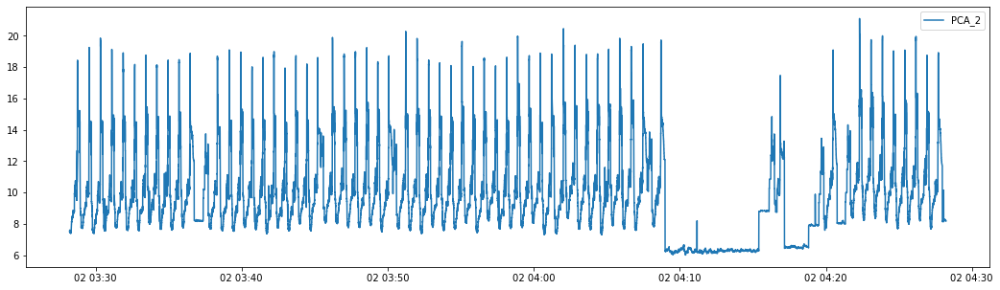

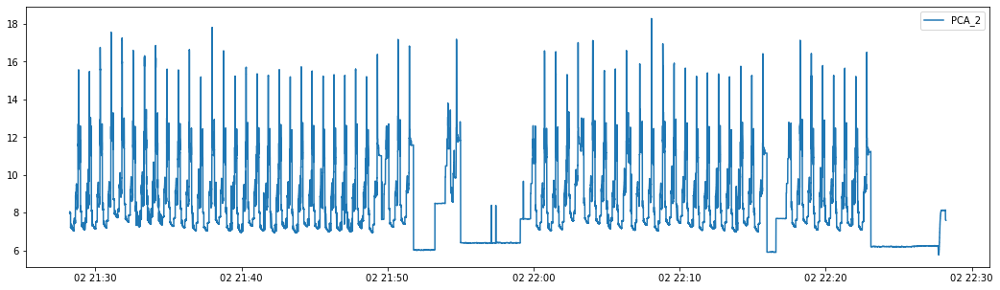

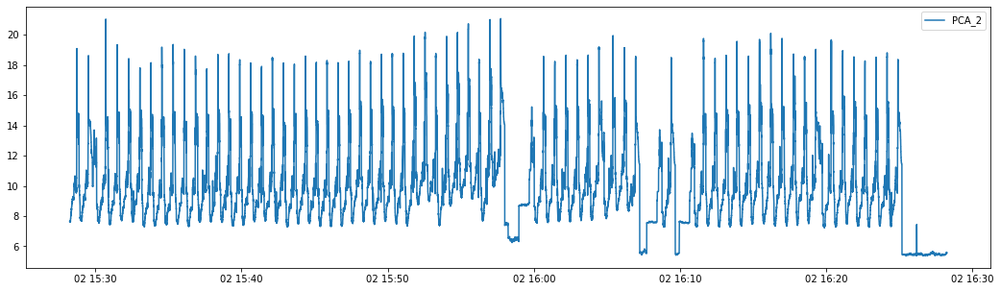

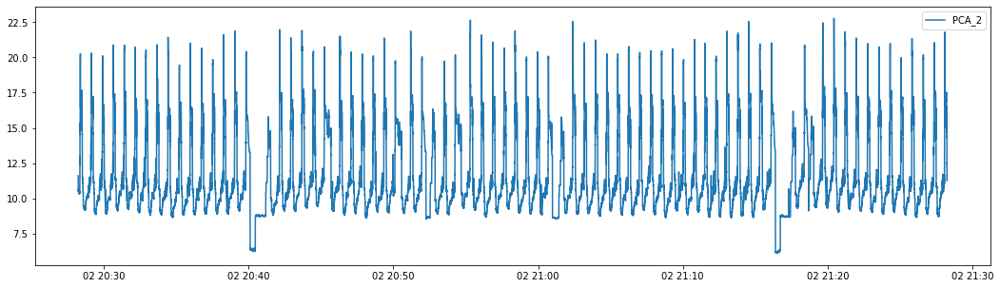

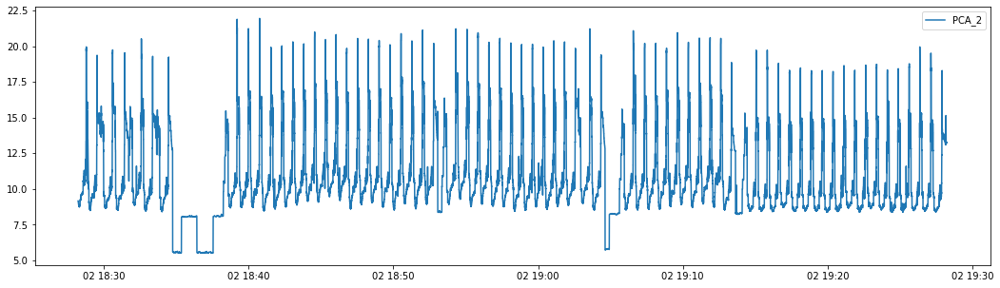

...

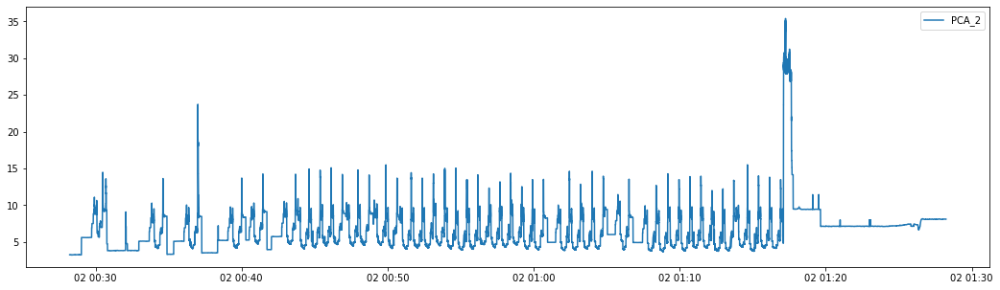

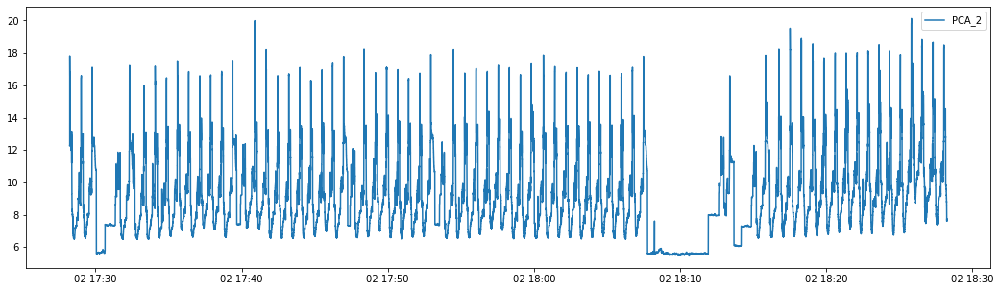

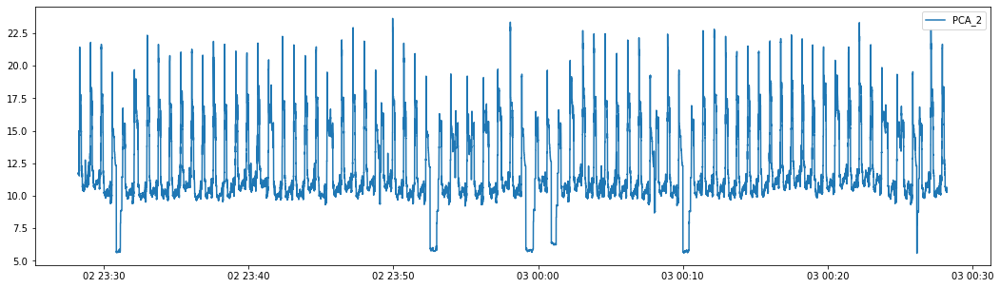

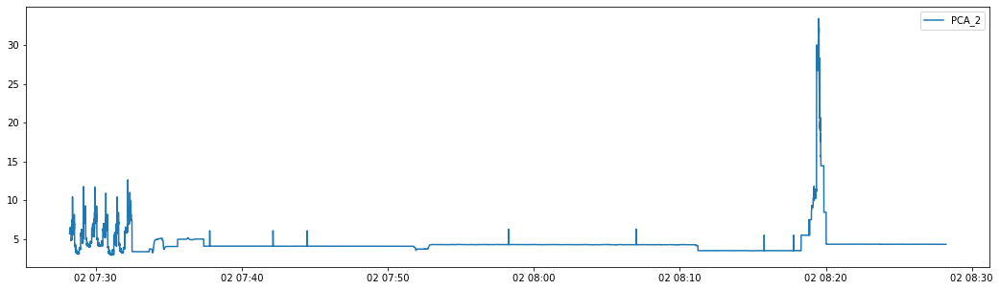

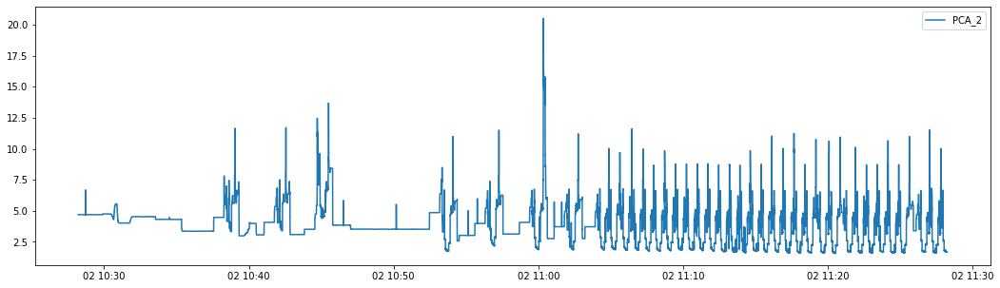

In [18]:
fl = os.getcwd()+"/data/211002_E40"
times = []
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
        df.set_index('Time',inplace = True)
        df_scaled = scaler.fit_transform(df.to_numpy())
        df_pca = pca.transform(df_scaled)
        df_restored=pca.inverse_transform(df_pca)
        score = get_anomaly_scores(df_scaled, df_restored)
        times.append(end - start)
        plt.figure(figsize=(18,5))
        plt.plot(score,label='PCA_2')
        plt.legend()
        plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

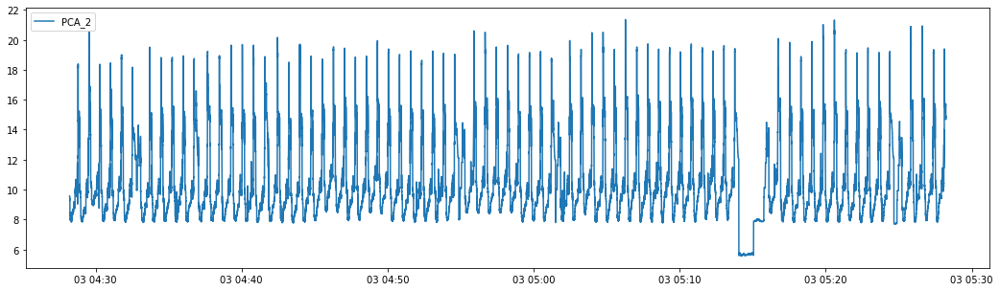

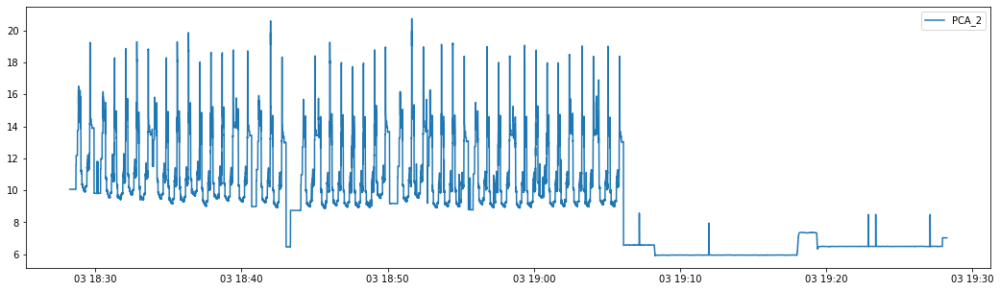

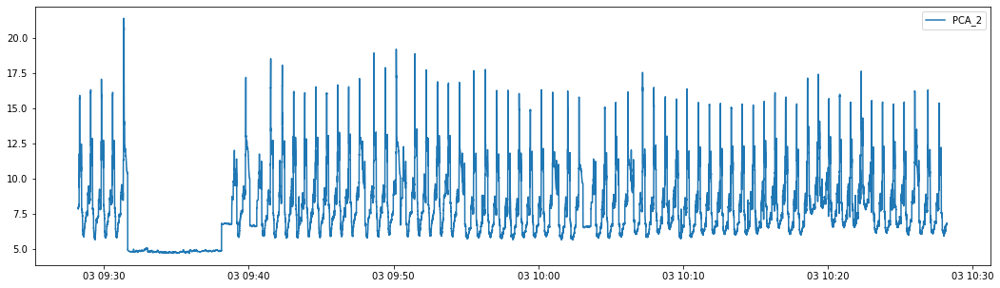

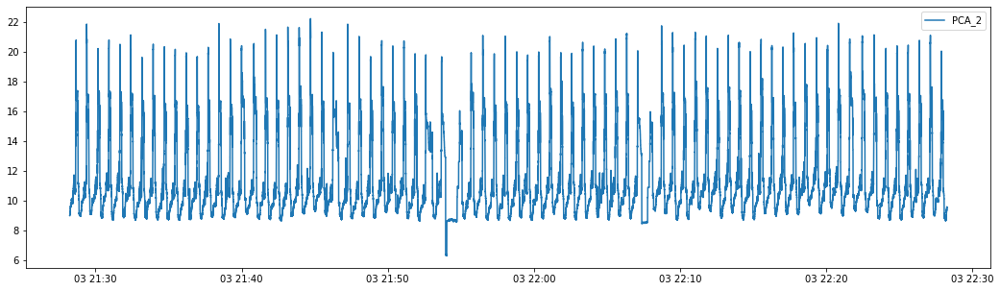

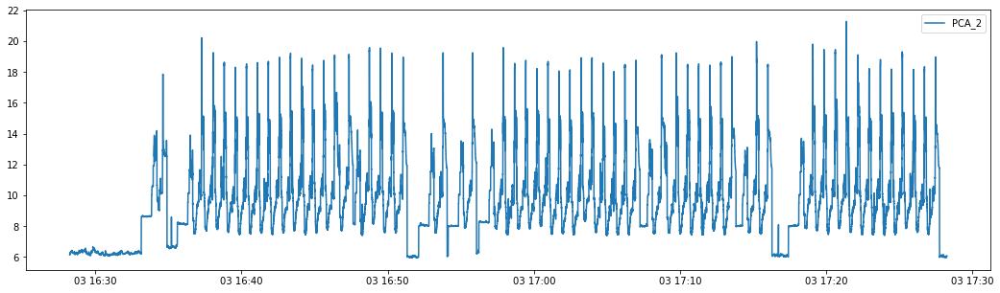

...

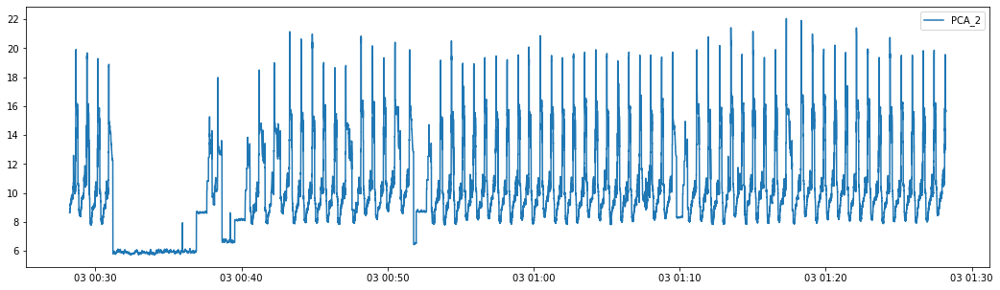

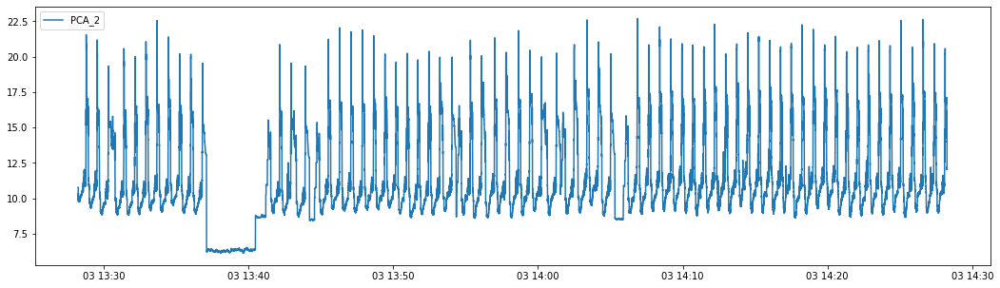

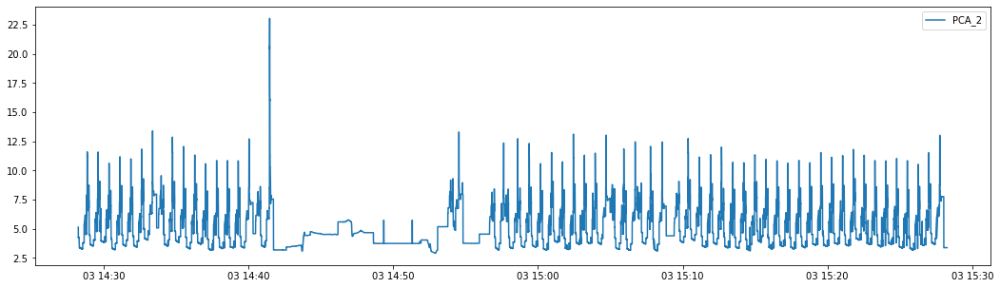

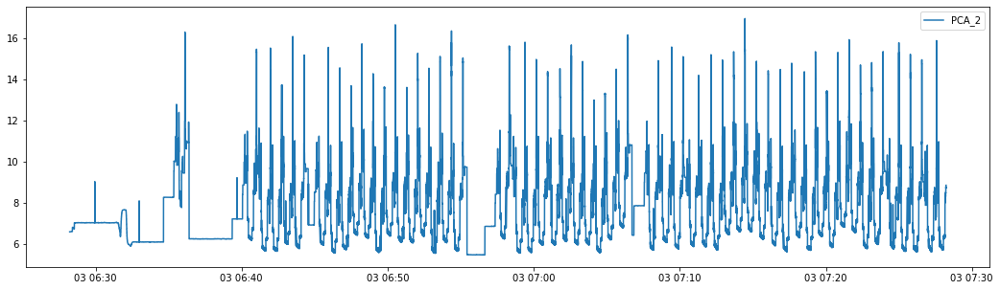

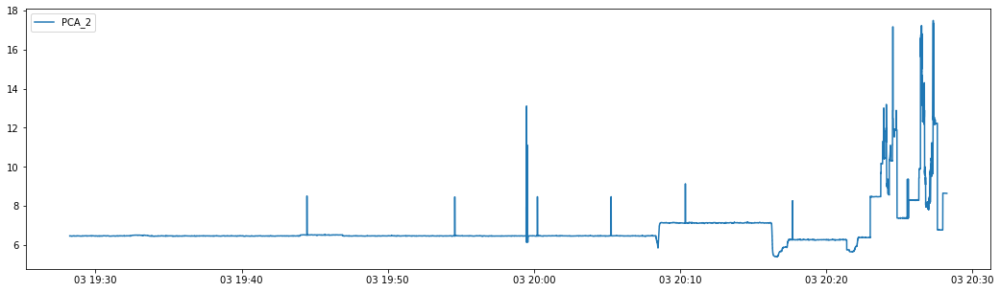

In [19]:
fl = os.getcwd()+"/data/211003_E40"
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
        df.set_index('Time',inplace = True)
        if df.shape[1]==270:
            df_scaled = scaler.fit_transform(df.to_numpy())
            df_pca = pca.transform(df_scaled)
            df_restored=pca.inverse_transform(df_pca)
            score = get_anomaly_scores(df_scaled, df_restored)
            plt.figure(figsize=(18,5))
            plt.plot(score,label='PCA_2')
            plt.legend()
            plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

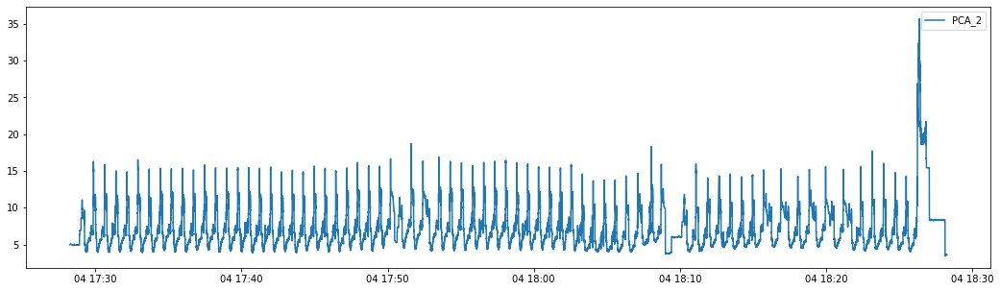

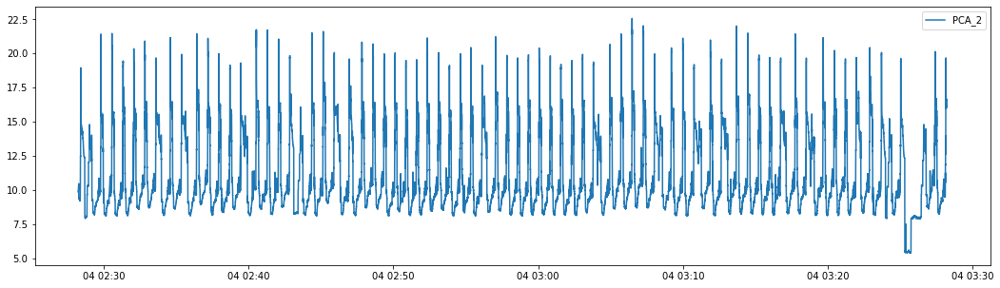

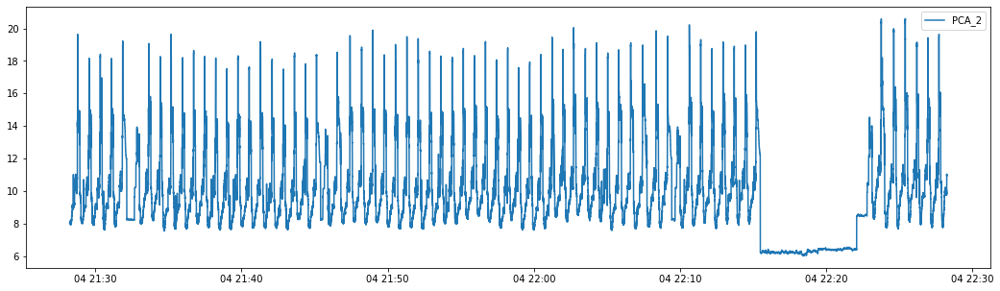

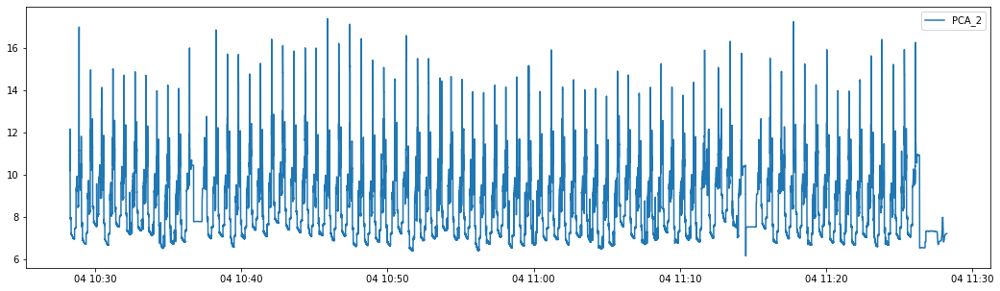

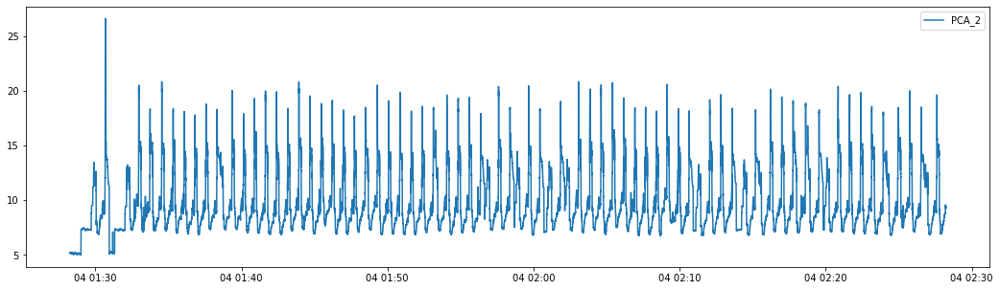

...

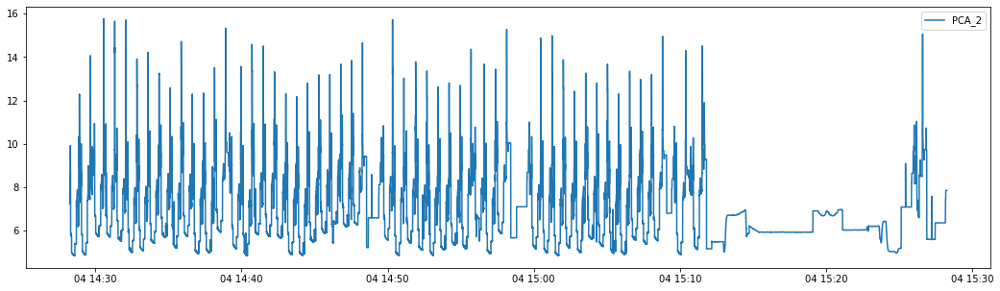

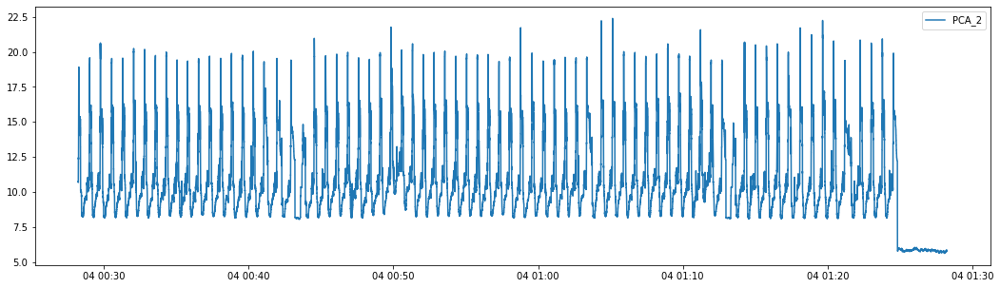

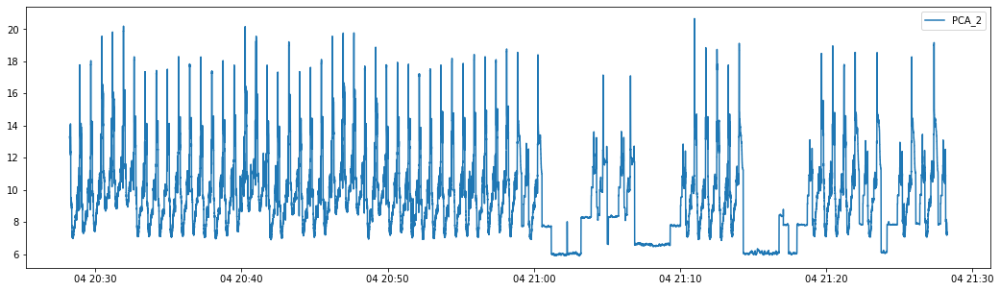

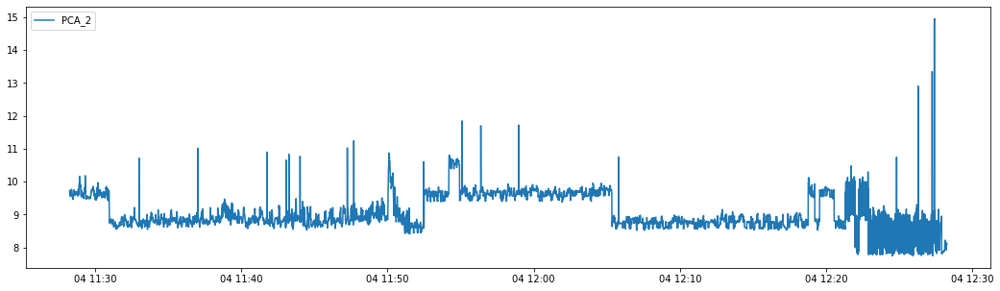

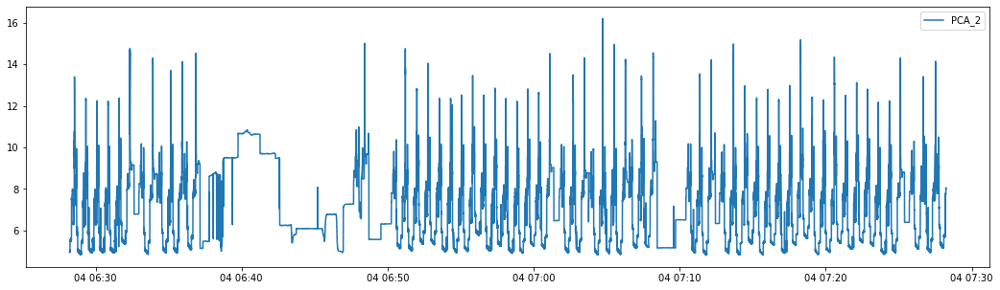

In [20]:
fl = os.getcwd()+"/data/211004_E40"
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        try:
            df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
            df.set_index('Time',inplace = True)
            if df.shape[1]==270:
                df_scaled = scaler.fit_transform(df.to_numpy())
                df_pca = pca.transform(df_scaled)
                df_restored=pca.inverse_transform(df_pca)
                score = get_anomaly_scores(df_scaled, df_restored)
                plt.figure(figsize=(18,5))
                plt.plot(score,label='PCA_2')
                plt.legend()
                plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))
        except UnicodeDecodeError:
            pass

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

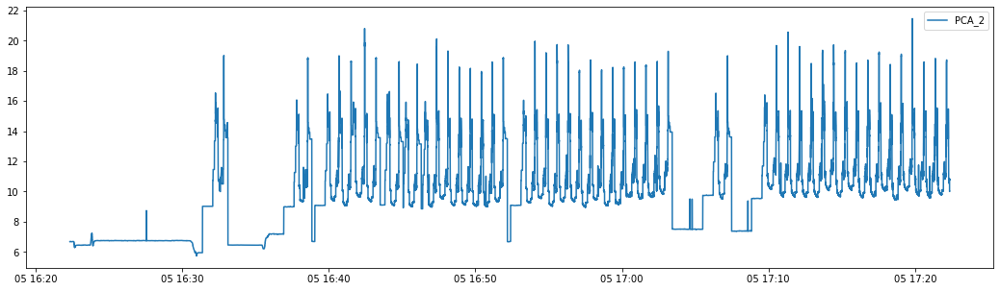

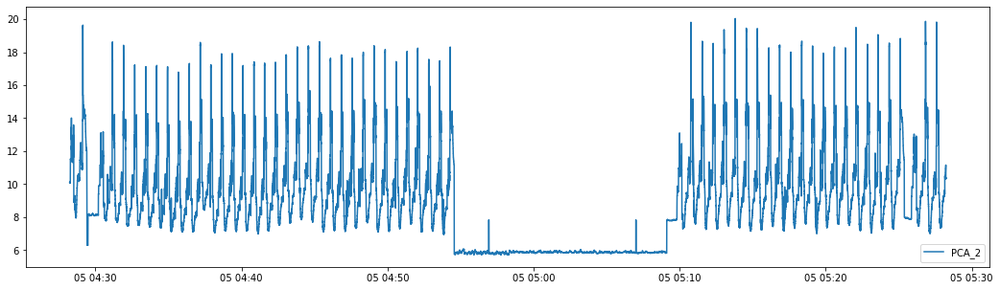

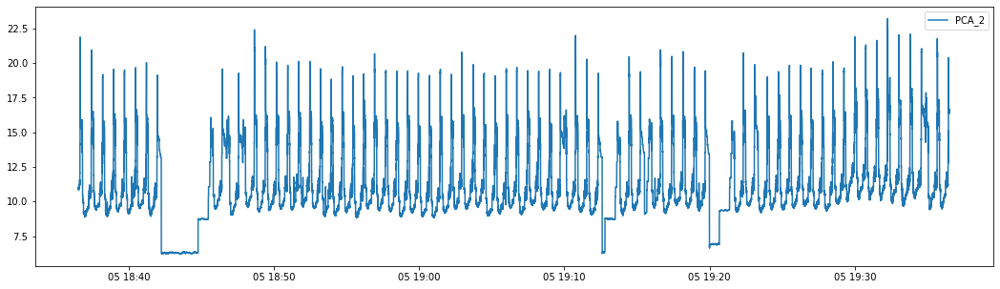

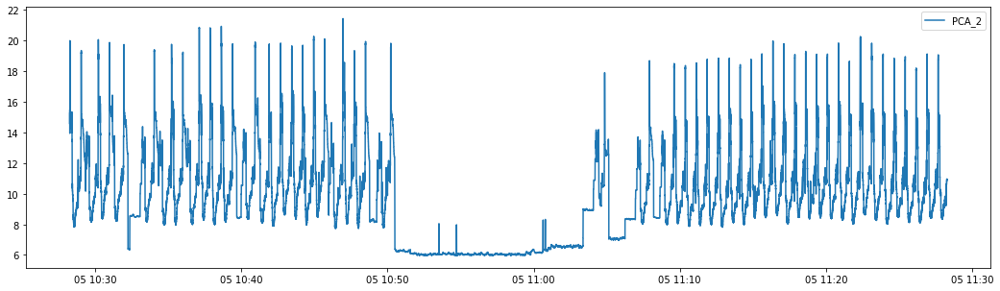

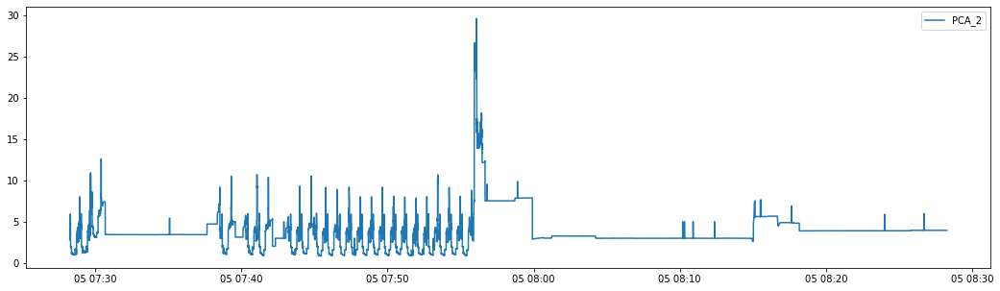

...

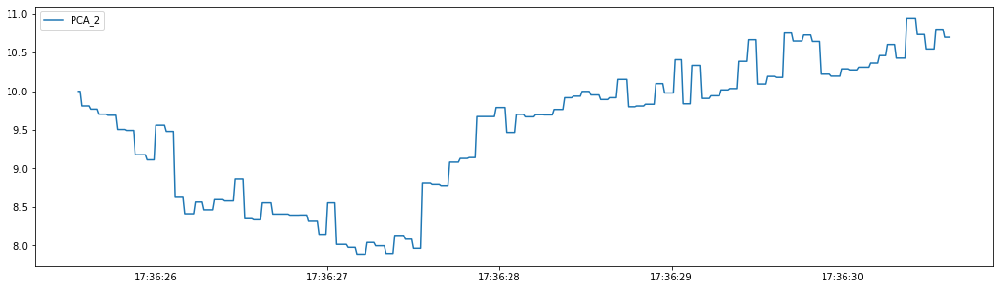

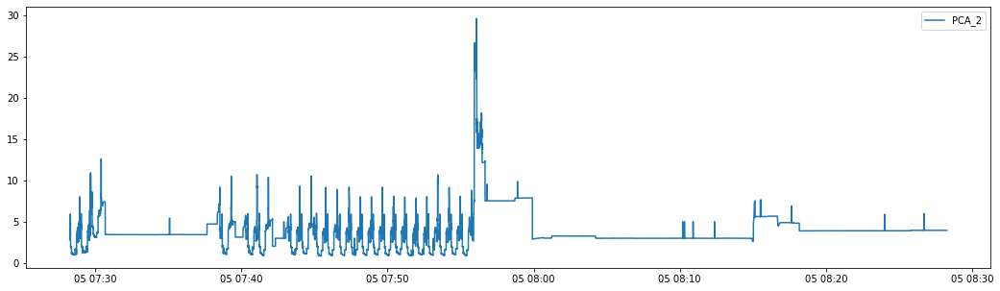

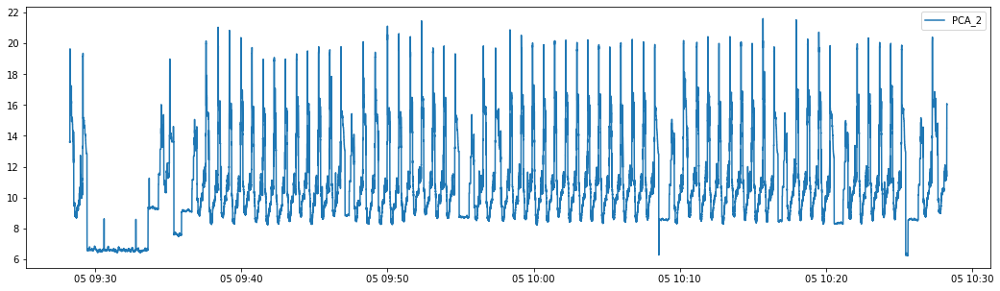

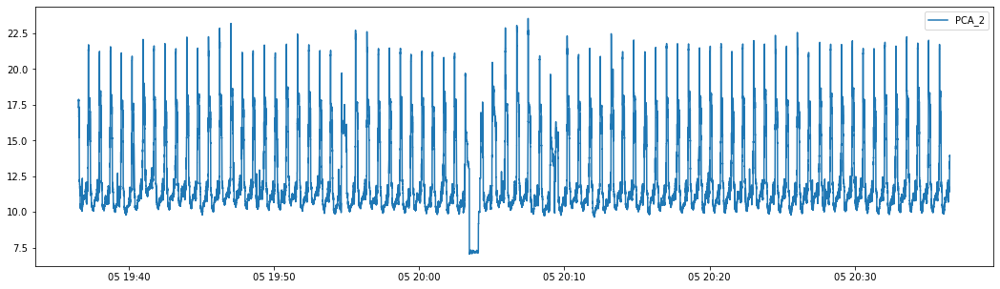

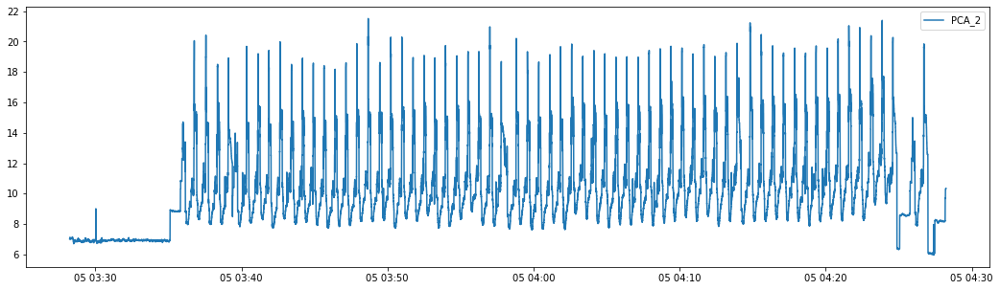

In [24]:
fl = os.getcwd()+"/data/211005_E40"
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        try:
            df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
            df.set_index('Time',inplace = True)
            if df.shape[1]==270:
                df_scaled = scaler.fit_transform(df.to_numpy())
                df_pca = pca.transform(df_scaled)
                df_restored=pca.inverse_transform(df_pca)
                score = get_anomaly_scores(df_scaled, df_restored)
                plt.figure(figsize=(18,5))
                plt.plot(score,label='PCA_2')
                plt.legend()
                plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))
        except UnicodeDecodeError:
            pass

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

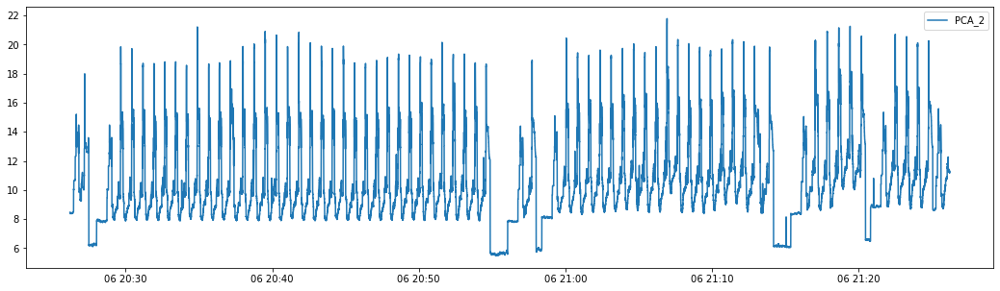

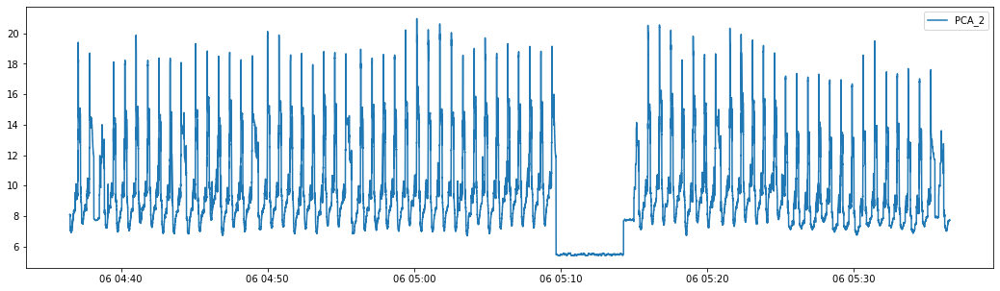

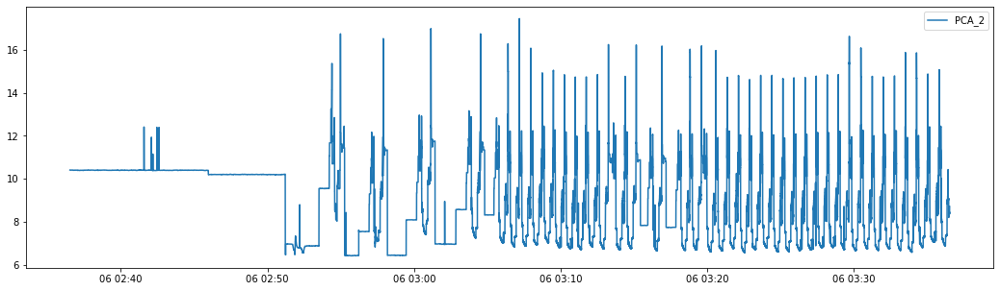

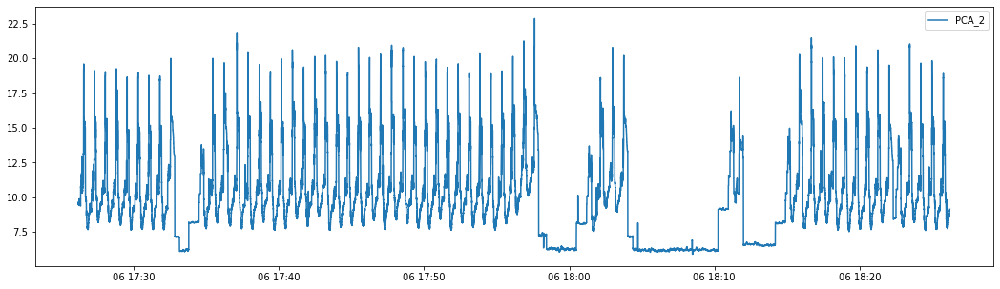

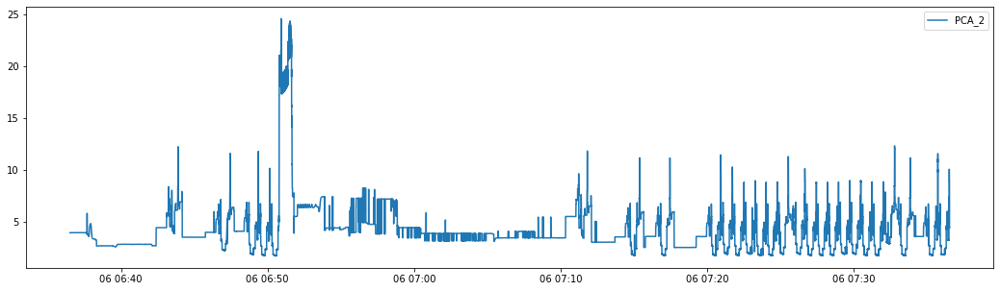

...

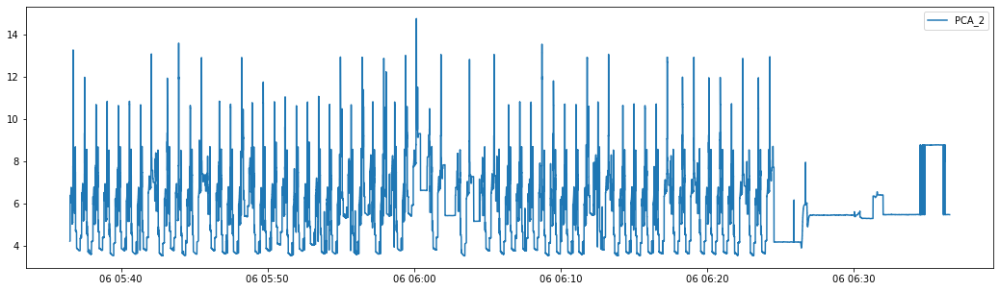

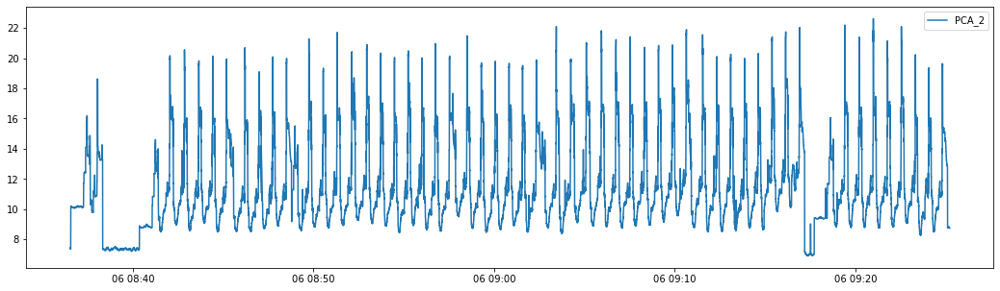

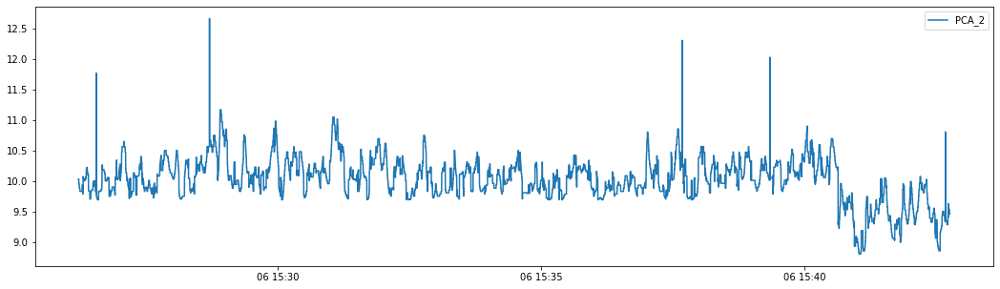

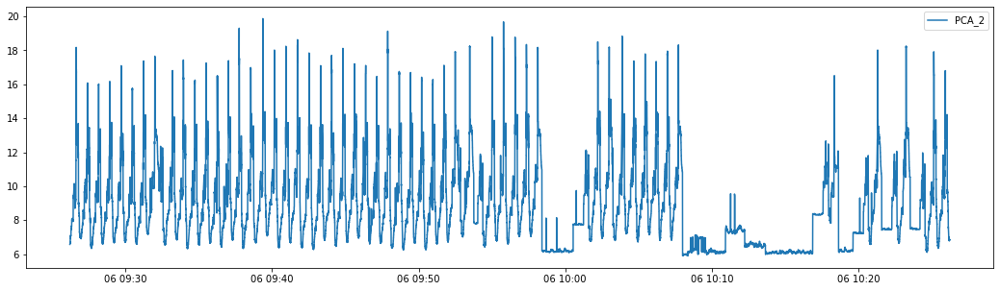

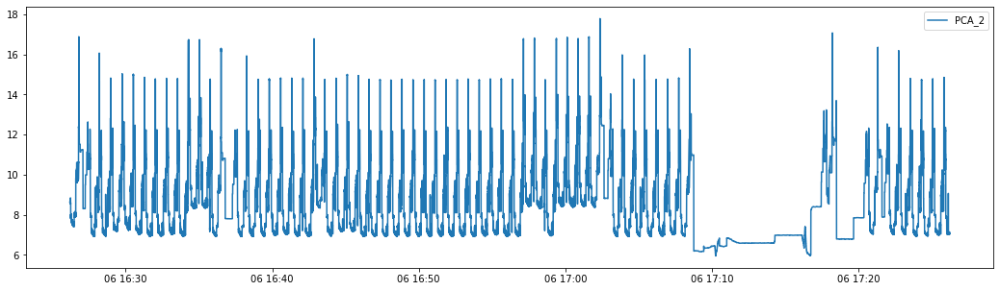

In [22]:
fl = os.getcwd()+"/data/211006_E40"
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
        df.set_index('Time',inplace = True)
        if df.shape[1]==270:
            df_scaled = scaler.fit_transform(df.to_numpy())
            df_pca = pca.transform(df_scaled)
            df_restored=pca.inverse_transform(df_pca)
            score = get_anomaly_scores(df_scaled, df_restored)
            plt.figure(figsize=(18,5))
            plt.plot(score,label='PCA_2')
            plt.legend()
            plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))

/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/gagan/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names,

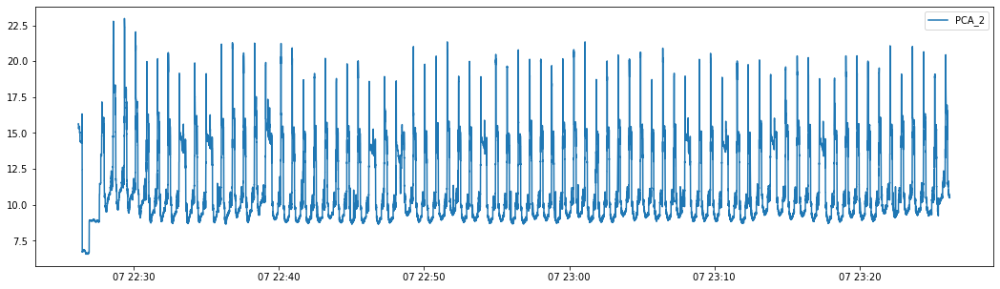

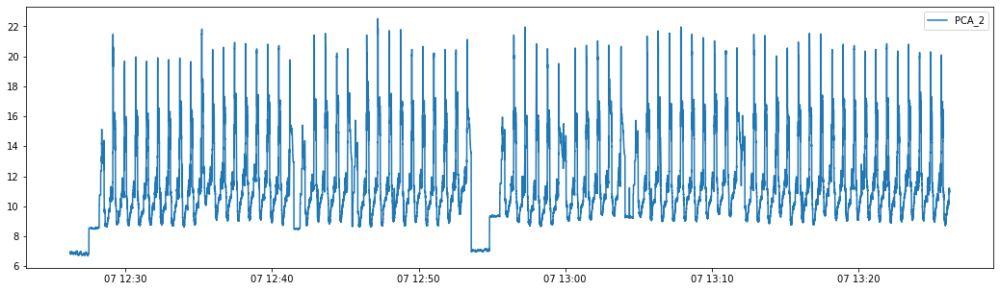

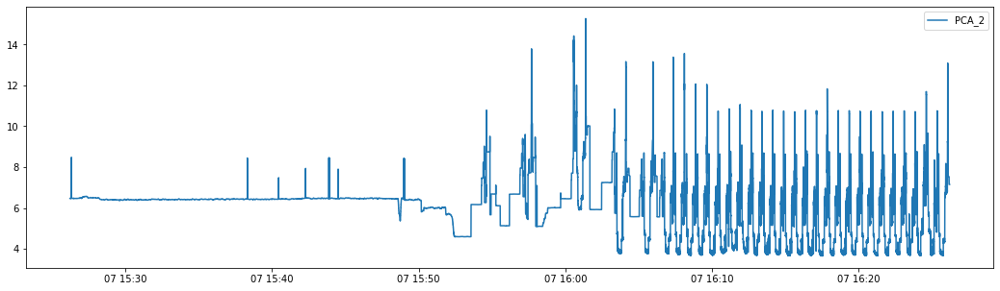

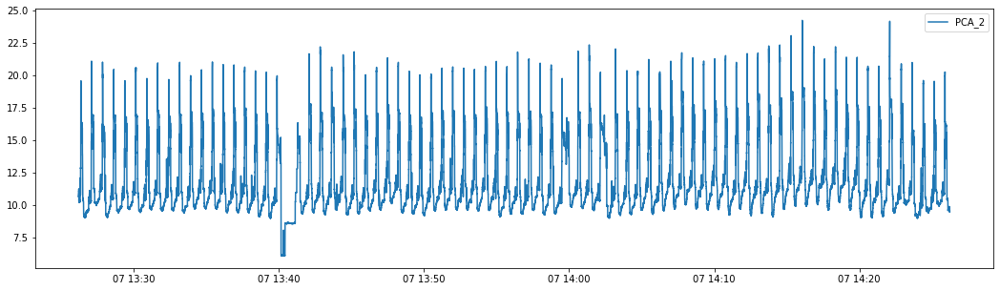

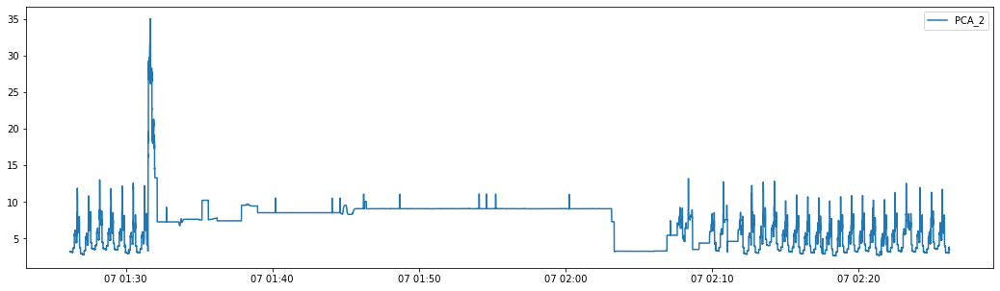

...

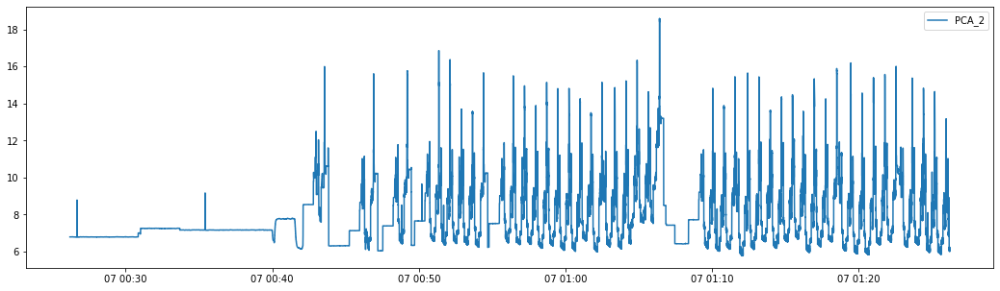

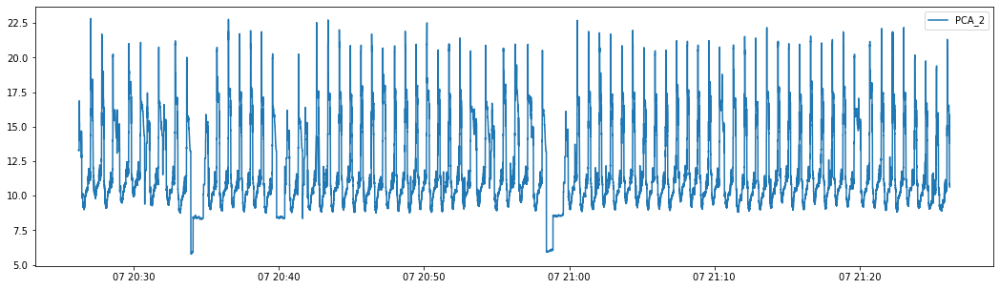

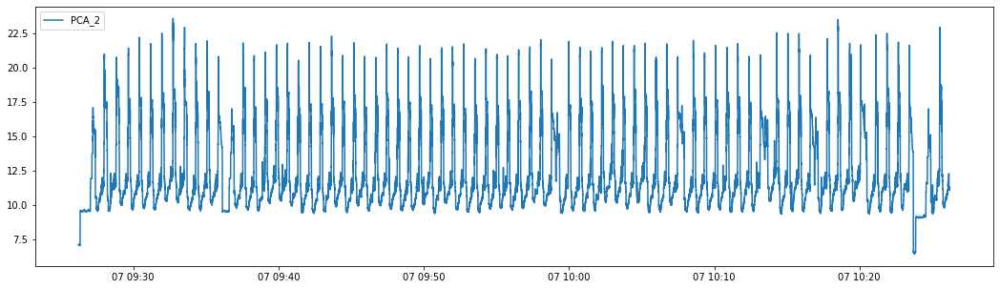

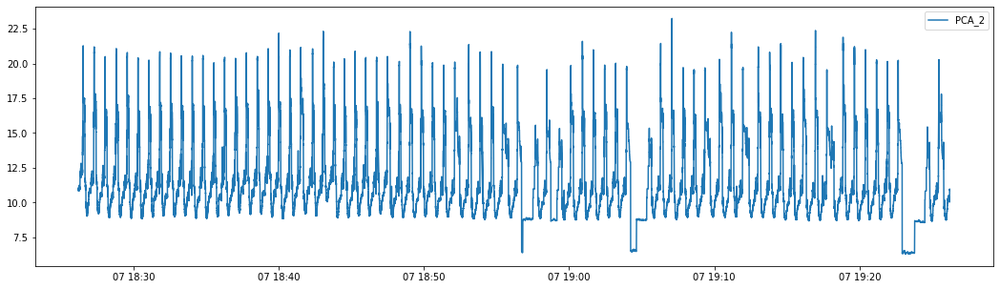

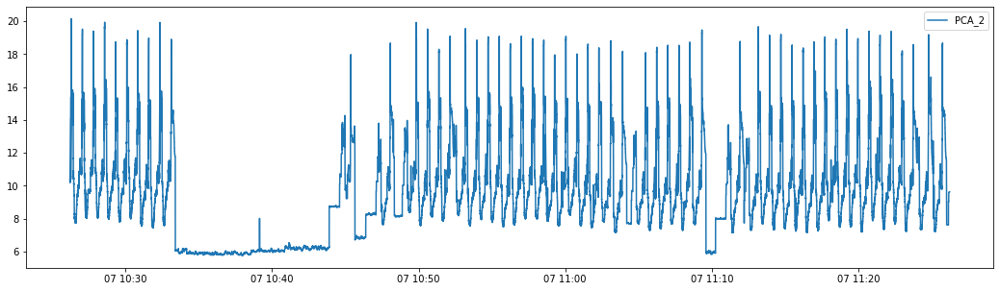

In [23]:
fl = os.getcwd()+"/data/211007_E40"
for file in  os.listdir(fl):
    if os.path.isfile(fl+"/"+file):
        df = pd.read_csv(fl+"/"+file,sep='\t',parse_dates=['Time'],date_parser=d_parser)
        df.set_index('Time',inplace = True)
        if df.shape[1]==270:
            df_scaled = scaler.fit_transform(df.to_numpy())
            df_pca = pca.transform(df_scaled)
            df_restored=pca.inverse_transform(df_pca)
            score = get_anomaly_scores(df_scaled, df_restored)
            plt.figure(figsize=(18,5))
            plt.plot(score,label='PCA_2')
            plt.legend()
            plt.savefig(fl+"/Untitled Folder/"+file.replace('.txt','.png'))
